Capstone Project Rubric - Python Quickstrike
1. Dataset Selection (10 points)
• Criteria: Choose a relevant dataset that aligns with your project goals.
• Guidance: Clearly state the dataset’s source and its suitability for your topic.

2. Project Objectives (15 points)
• Criteria: Define what you expect to explore or achieve.
• Guidance: Briefly explain your goals and anticipated insights.

3. Python Skills Demonstration (40 points)
• Criteria: Demonstrate at least 3-4 Python skills learned in this course.
• Skills to Consider:
• Data manipulation with pandas
• Data visualization
• Basic machine learning techniques
• Using APIs for data collection
• Guidance: Integrate skills in meaningful ways to achieve your project goals.

4. Code Quality and Documentation (20 points)
• Criteria: Ensure your code is clean, readable, and well-documented.
• Guidance: Use comments to clarify code, maintain good naming conventions, and
structure your project for easy navigation.

5. Project Presentation (15 points)
• Criteria: Prepare a brief presentation or summary of your project findings.
• Guidance: Summarize key insights and demonstrate how Python tools helped
achieve them.


---


The overall goal of our project is to gain more insight into music by utilizing Python to analyze hundreds of thousands of songs from distinct genres in various ways, and we expand upon what questions we'd like to answer below. To this end, we chose to use the Spotify Tracks Dataset from Kaggle which has information of thousands of songs on 15 distinct metrics that you can use to measure a song (such as popularity, tempo, and loudness). Given the wealth of quantitative data on songs that this dataset provides, we chose to use this dataset to answer our questions.

**Objectives and anticipated insights:**

**Objective 1**: Determine if there are differences among specific song metrics based on the song's genre. To address this question, we will divide songs into their genre and then characterize the metrics of songs using things like average, min, max, range, etc. We can then visualize the resulting data to more easily compare genre's metrics to each other. We can also use Interquartile Range/Boxplots to detect any songs that are outliers for a particular metric in a particular genre (example- which songs are significantly loud acoustic songs?). This objective will utilize Pandas to perform the described calculations and Matplotlib/Seaborn to visualize resulting calculations.

**Objective 2**: Determine if there are correlations between song metrics across all songs. For example, if a song is popular, does it have a lot of danceability? If a song is loud, does it have a lot of energy? We can use linear regression analysis to compare 2 metrics to each other and determine if they have a positive or negative correlation- if there is any correlation at all. We can also quantify this correlation by calculating the R-squared value to determine if the correlation is signficant. This objective will utilize Pandas to perform the described calculations, Matplotlib/Seaborn to visualize resulting calculations, and Scikit-learn to perform regression analysis.

**Objective 3**: Determine if grouping songs according to their characteristics will naturally separate them according to their genre. If we take metrics such as a song's popularity, danceability, energy, loudness, speechiness, acousticness, instrumentalness, tempo, and key into account and utilize clustering to group the songs, can we resolve the separate genres? This objective will utilize Pandas to perform PCA and Scikit-learn to perform K-means clustering.

**Objective 4**: Determine if we can predict the genre of a song based on the song's metrics. We can utilize machine learning to train a classification model using Logistic Regression to attempt to do so. This objective will utilize machine learning, specifically Scikit-learn's Logistic Regression to train the model and make predictions.

In [ ]:
#We began by utilizing Kaggle's API to download the dataset via Python.
#This was done locally by Vanessa on her laptop. The dataset was then uploaded to Google Drive for use here.
#Note that the code won't run properly here since this was done locally by Vanessa. This is written here just for our knowledge.

#Installing all necessary packages and downloading the dataset from Kaggle
#URL link to the dataset: https://www.kaggle.com/datasets/maharshipandya/-spotify-tracks-dataset/data

#Installing and importing all needed packages to obtain the Kaggle dataset:
pip install kaggle
pip install kagglehub
import os
import kagglehub

#Setting the KAGGLE_CONFIG_DIR environment variable to point to the folder containing kaggle.json
os.environ['KAGGLE_CONFIG_DIR'] = r'C:\Users\Vanessa\Downloads'

#Verify if it's set correctly
print(os.environ['KAGGLE_CONFIG_DIR'])

#Download the dataset and show its path
path = kagglehub.dataset_download("maharshipandya/-spotify-tracks-dataset")
print("Path to dataset files:", path)

#The file was then renamed to "Spotify_Dataset.csv" and uploaded to Google Drive

SyntaxError: invalid syntax (<ipython-input-10-86bad55a0d55>, line 8)

In [ ]:
#Here, we use pandas to read the CSV file into a dataframe.

#Importing pandas for use to create dataframe
import pandas as pd

#Defining the path to read in the dataset's CSV file from Google Drive
from google.colab import drive
drive.mount('/content/drive')
file_path = '/content/drive/My Drive/Spotify_Dataset.csv'

#Loading the CSV file into a pandas DataFrame, naming the DataFrame df
df = pd.read_csv(file_path)

#Printing the names of all the column titles so we know what categories we have for analysis
print("Column Titles:")
print(df.columns.tolist())

#Displaying the first 5 rows of the dataset to see information available to us
print(df.head(5))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Column Titles:
['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name', 'popularity', 'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature', 'track_genre']
   Unnamed: 0                track_id                 artists  \
0           0  5SuOikwiRyPMVoIQDJUgSV             Gen Hoshino   
1           1  4qPNDBW1i3p13qLCt0Ki3A            Ben Woodward   
2           2  1iJBSr7s7jYXzM8EGcbK5b  Ingrid Michaelson;ZAYN   
3           3  6lfxq3CG4xtTiEg7opyCyx            Kina Grannis   
4           4  5vjLSffimiIP26QG5WcN2K        Chord Overstreet   

                                          album_name  \
0                                             Comedy   
1                                   Ghost (Acoustic)   
2                    

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Column Titles:
['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name', 'popularity', 'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature', 'track_genre']
   Unnamed: 0                track_id                 artists  \
0           0  5SuOikwiRyPMVoIQDJUgSV             Gen Hoshino   
1           1  4qPNDBW1i3p13qLCt0Ki3A            Ben Woodward   
2           2  1iJBSr7s7jYXzM8EGcbK5b  Ingrid Michaelson;ZAYN   
3           3  6lfxq3CG4xtTiEg7opyCyx            Kina Grannis   
4           4  5vjLSffimiIP26QG5WcN2K        Chord Overstreet   

                                          album_name  \
0                                             Comedy   
1                                   Ghost (Acoustic)   
2                    

<ipython-input-13-ba45461cd37e>:97: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot (x=top_20_genres.index, y=top_20_genres, palette='viridis')


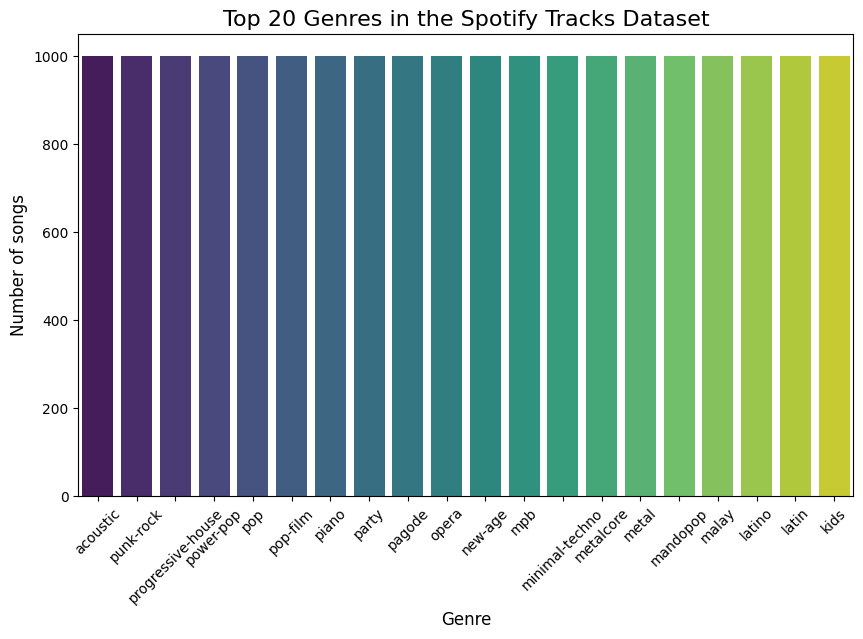

Pop Data Sample:
        danceability  popularity
12000         0.576          47
12001         0.577          44
12002         0.641          50
12003         0.613          48
12004         0.646          54
Hip-Hop Data Sample:
        danceability  popularity
51000         0.860          83
51001         0.768          83
51002         0.711          82
51003         0.796          77
51004         0.591          89
Pop Stats:
         danceability  popularity
mean        0.579987   43.199222
min         0.101000    0.000000
max         0.953000  100.000000
std         0.138972   22.981127
median      0.586000   48.000000
range       0.852000  100.000000

Hip-Hop Stats:
         danceability  popularity
mean        0.736154   37.759000
min         0.329000    0.000000
max         0.964000   99.000000
std         0.119155   32.550891
median      0.753000   58.000000
range       0.635000   99.000000


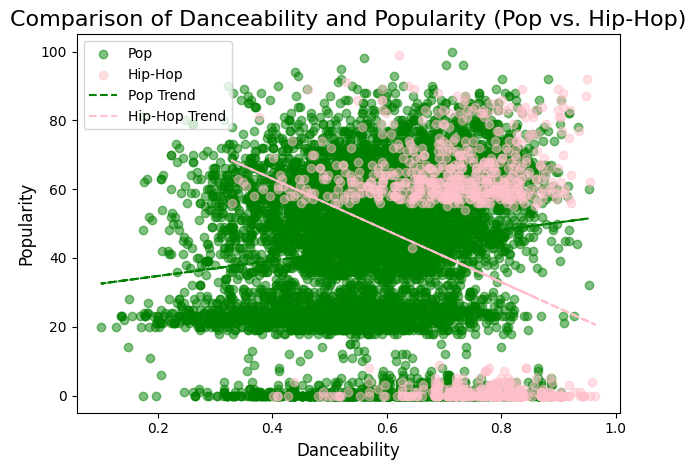

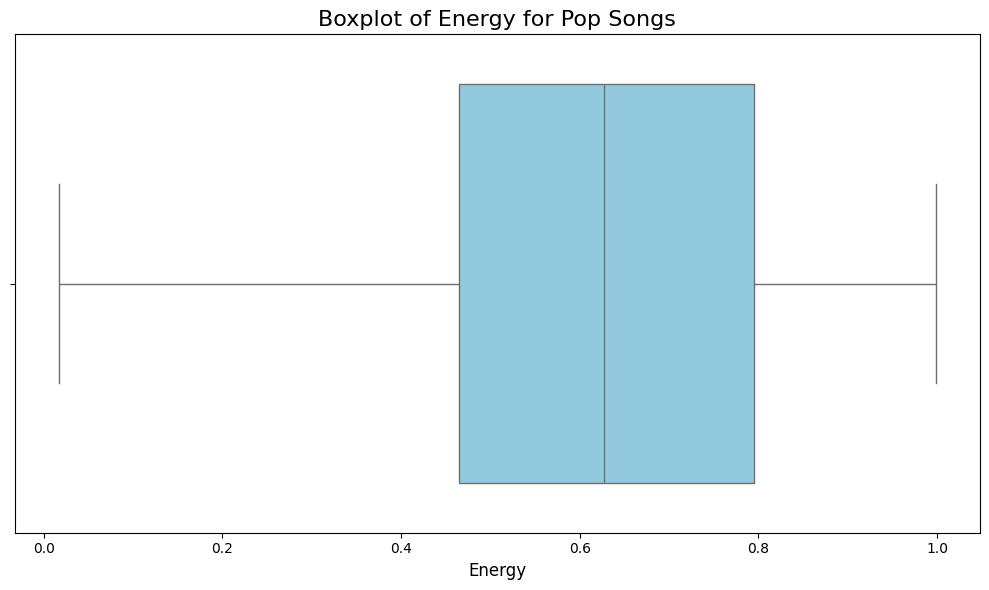

In [ ]:
#Objective 1:
#Here, we use pandas to read the CSV file into a dataframe.

#Import pandas for use to create dataframe. Import libraries for visualization
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

#Defining the path to read in the dataset's CSV file from Google Drive. CHANGE for my drive
from google.colab import drive
drive.mount('/content/drive')
file_path = '/content/drive/My Drive/Spotify_Dataset.csv'

#Loading the CSV file into a pandas DataFrame. DataFrame is named 'df' for continuity.
df = pd.read_csv(file_path)

#Printing the names of all the column titles so we know what categories we have for analysis
print("Column Titles:")
print(df.columns.tolist())

#Displaying the first 5 rows of the dataset to see information available to us
print(df.head(5))

#Objective 1a: Divide songs by genre and visualize the top 20 genres, including the number of songs per genre.

#Fill in any missing values in the dataset, with 'Unknown'
df['track_genre'] = df['track_genre'].fillna('Unknown')

#Count the number of songs for each genre
genre_counts = df['track_genre'].value_counts()

#Find the top 20 genres
top_20_genres = genre_counts.head(20)

#Print the top 20 genres and their song counts
print(top_20_genres)


# Convert top 20 genres to a DataFrame for better presentation
top_20_genres_df = top_20_genres.reset_index()
top_20_genres_df.columns = ['Genre', 'Number of Songs']

# Display the table in a clean format
print("\nTop 20 Genres in DataFrame Format:")
print(top_20_genres_df)

# # Plot the top 20 genres with Matplotlib
# plt.figure(figsize=(10, 6))
# top_20_genres.plot(kind='bar', color='skyblue')
# plt.title('Top 20 Genres and the Number of Songs')
# plt.xlabel('Genre')
# plt.ylabel('Number of Songs')
# plt.xticks(rotation=45, ha='right')
# plt.tight_layout()
# plt.show()

# # Plot the top 20 genres with Seaborn
# plt.figure(figsize=(10, 6))
# sns.barplot(x=top_20_genres.index, y=top_20_genres, palette='viridis')

# # Add title and labels
# plt.title('Top 20 Genres in the Spotify Tracks Dataset', fontsize=16)
# plt.xlabel('Genre', fontsize=12)
# plt.ylabel('Number of Songs', fontsize=12)

# # Rotate the x-axis labels for readability
# plt.xticks(rotation=45)

# # Display the plot
# plt.tight_layout()
# plt.show()

# print ("Top 20 Genres and the Number of Songs in Each Genre:")
# print(genre_counts)

# # Plot the top 20 genres with plt
# plt.figure(figsize=(10, 6))
# top_20_genres.plot(kind='bar', color='skyblue')
# plt.title('Top 20 Genres and the Number of Songs')
# plt.xlabel('Genre')
# plt.ylabel('Number of Songs')
# plt.xticks(rotation=45, ha='right')
# plt.tight_layout()
# plt.show()

#The print is underwhelming, make a table with more readble columns and rows
#Convert top 20 genres to a DataFrame for better presentation
#top_20_genres_df = top_20_genres.reset_index()
#top_20_genres_df.columns = ['Genre, Number of Songs']
#print(top_20_genres_df)


#Plot the top 20 genres with sns
plt.figure(figsize=(10, 6))
sns.barplot (x=top_20_genres.index, y=top_20_genres, palette='viridis')

#Add title and labels
plt.title('Top 20 Genres in the Spotify Tracks Dataset', fontsize=16)
plt.xlabel('Genre', fontsize=12)
plt.ylabel('Number of songs', fontsize=12)

#Rotate the x-axis labels for readability
plt.xticks(rotation=45)

#Display!
plt.tight_layout
plt.show()

#Objective 1b: # Calculate descriptive statistics for Pop songs

# Filter for Pop and Hip-Hop songs
pop_songs = df[df['track_genre'].str.contains('Pop', case=False, na=False)]
hiphop_songs = df[df['track_genre'].str.contains('Hip-Hop', case=False, na=False)]

# Prepare the datasets for analysis
pop_data = pop_songs[['danceability', 'popularity']].dropna()
hiphop_data = hiphop_songs[['danceability', 'popularity']].dropna()

# Verify the data
print("Pop Data Sample:\n", pop_data.head())
print("Hip-Hop Data Sample:\n", hiphop_data.head())
pop_stats = pop_data[['danceability', 'popularity']].agg(['mean', 'min', 'max', 'std', 'median'])
pop_stats.loc['range'] = pop_stats.loc['max'] - pop_stats.loc['min']  # Add range calculation

# Calculate descriptive statistics for Hip-Hop songs
hiphop_stats = hiphop_data[['danceability', 'popularity']].agg(['mean', 'min', 'max', 'std', 'median'])
hiphop_stats.loc['range'] = hiphop_stats.loc['max'] - hiphop_stats.loc['min']  # Add range calculation

# Print the stats for both genres
print("Pop Stats:\n", pop_stats)
print("\nHip-Hop Stats:\n", hiphop_stats)

#Objective 1c: # Scatter plot for Pop songs
plt.scatter(pop_data['danceability'], pop_data['popularity'], color='green', label='Pop', alpha=0.5)

# Scatter plot for Hip-Hop songs
plt.scatter(hiphop_data['danceability'], hiphop_data['popularity'], color='pink', label='Hip-Hop', alpha=0.5)

# Linear regression for Pop
pop_regressor = LinearRegression()
pop_regressor.fit(pop_data[['danceability']], pop_data['popularity'])
pop_line = pop_regressor.predict(pop_data[['danceability']])

# Linear regression for Hip-Hop
hiphop_regressor = LinearRegression()
hiphop_regressor.fit(hiphop_data[['danceability']], hiphop_data['popularity'])
hiphop_line = hiphop_regressor.predict(hiphop_data[['danceability']])

# Plot the regression lines
plt.plot(pop_data['danceability'], pop_line, color='green', linestyle='--', label='Pop Trend')
plt.plot(hiphop_data['danceability'], hiphop_line, color='pink', linestyle='--', label='Hip-Hop Trend')

# Add titles, labels, and legend
plt.title('Comparison of Danceability and Popularity (Pop vs. Hip-Hop)', fontsize=16)
plt.xlabel('Danceability', fontsize=12)
plt.ylabel('Popularity', fontsize=12)
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


#Objective 1d: Detecting Low Outliers in Pop Genre Using Boxplots


# Remove missing values from the 'energy' column
pop_energy_data = pop_songs[['energy']].dropna()

# Calculate IQR for the 'energy' column
Q1 = pop_energy_data['energy'].quantile(0.25)
Q3 = pop_energy_data['energy'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower bound for low outliers
lower_bound = Q1 - 1.5 * IQR

# Identify low outliers
low_outliers = pop_energy_data[pop_energy_data['energy'] < lower_bound]


# Visualize with a boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x=pop_energy_data['energy'], color='skyblue')
plt.title('Boxplot of Energy for Pop Songs', fontsize=16)
plt.xlabel('Energy', fontsize=12)
plt.tight_layout()
plt.show()


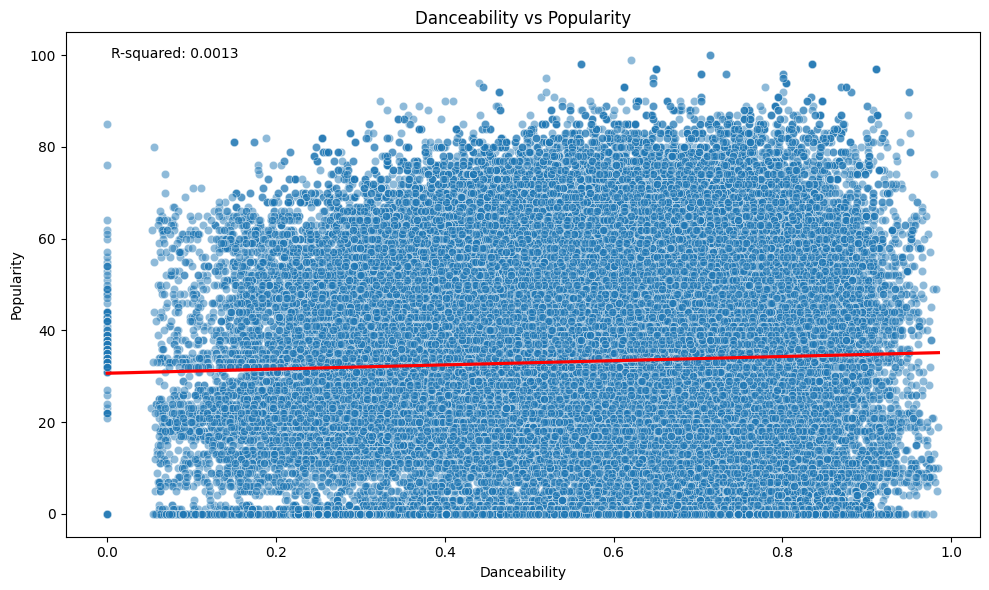

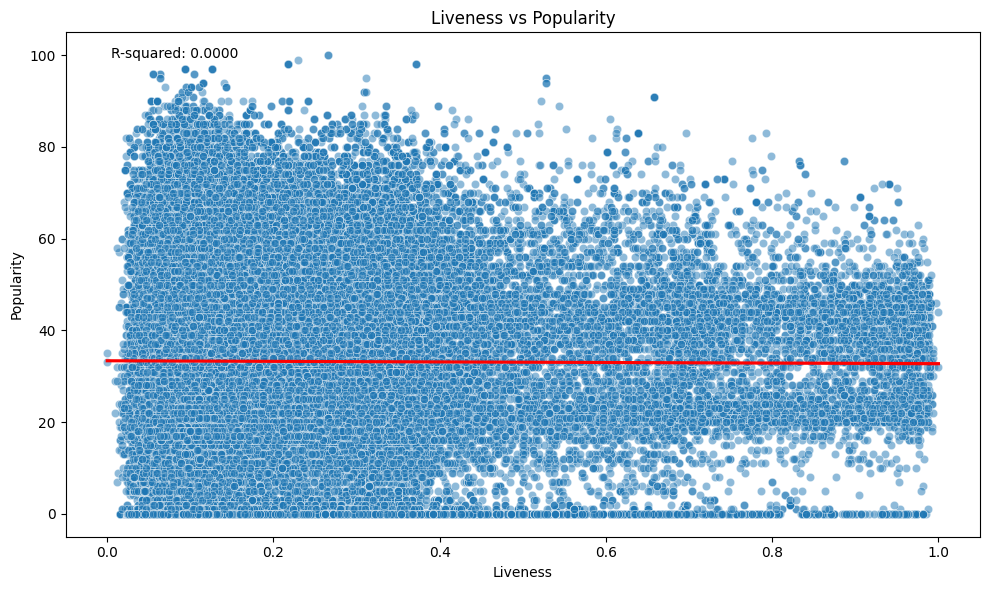

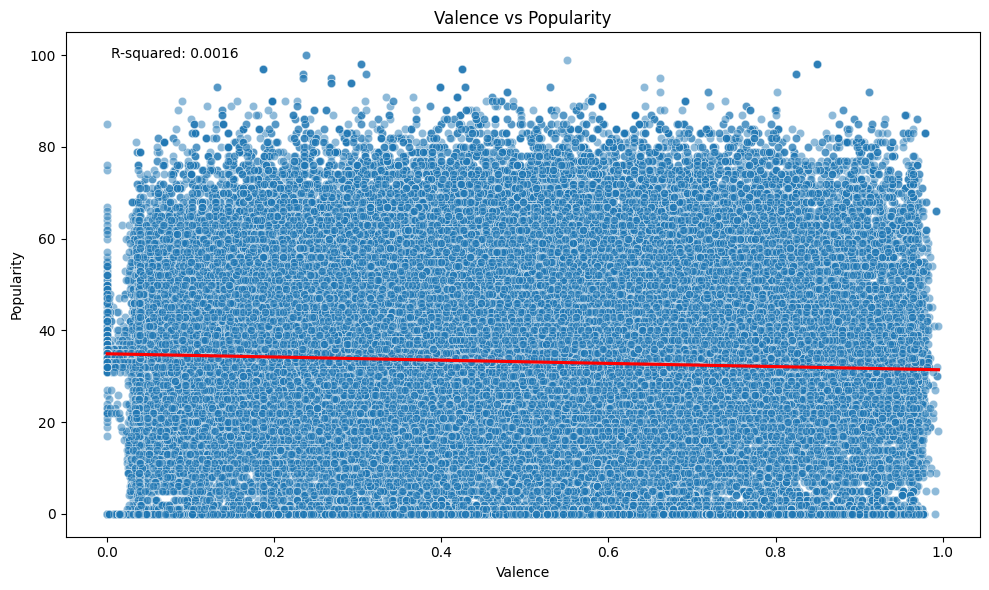

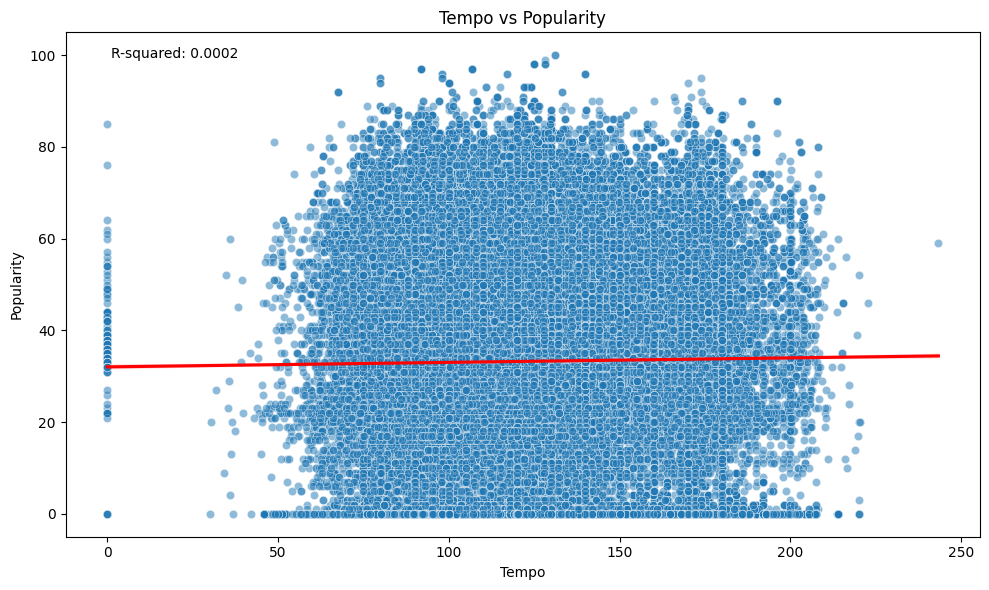

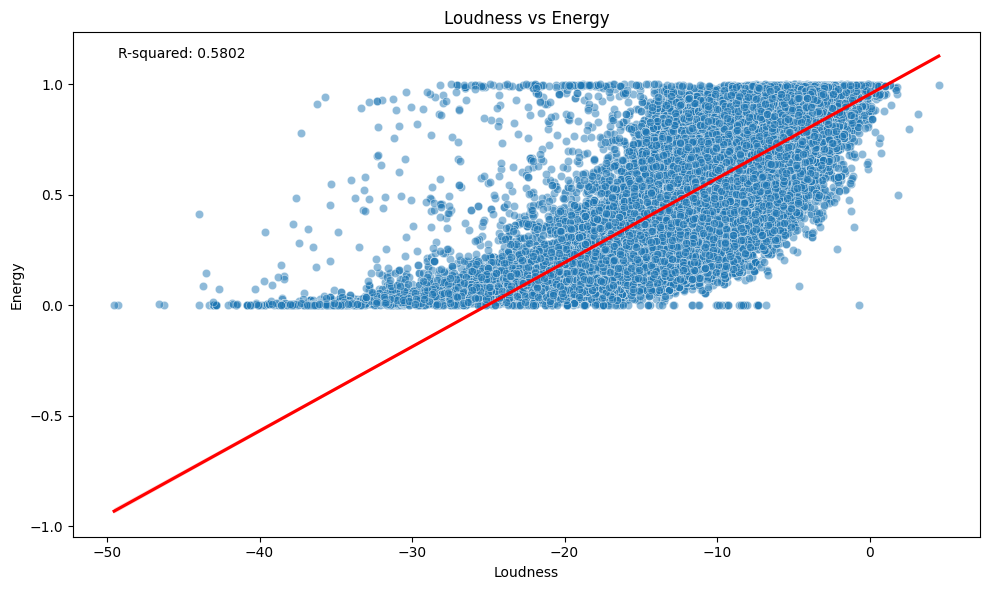

...

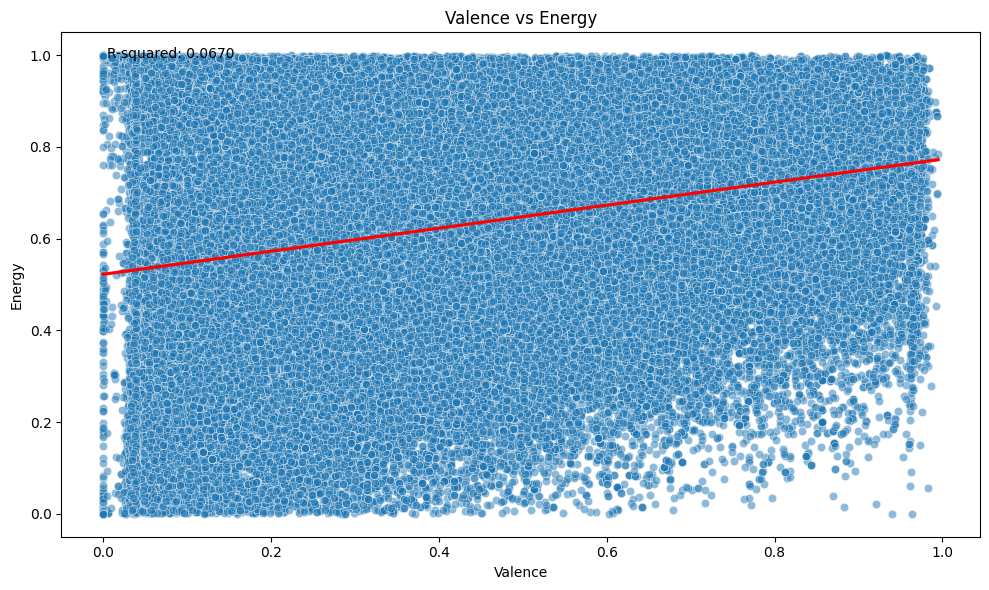

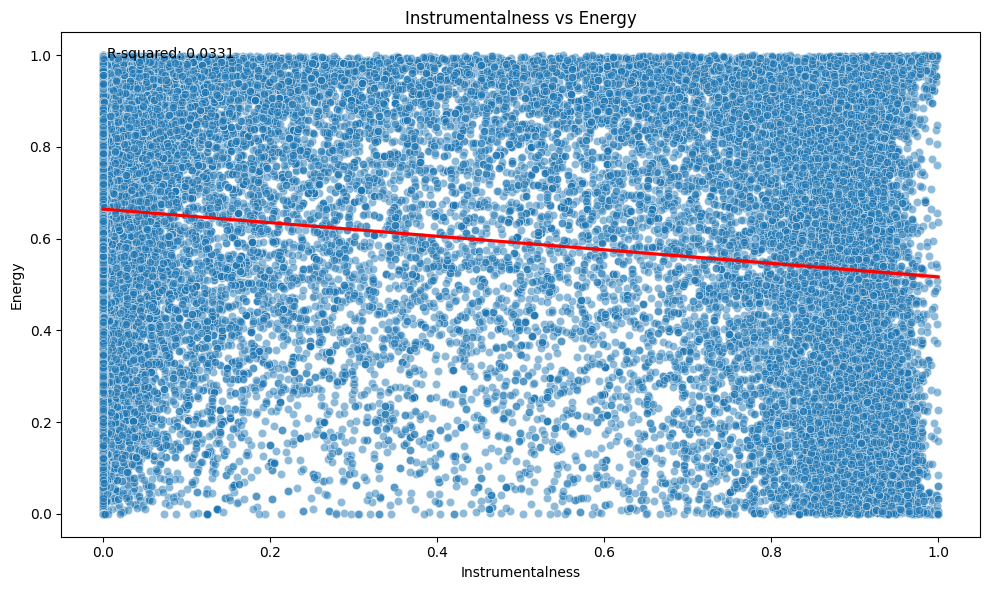

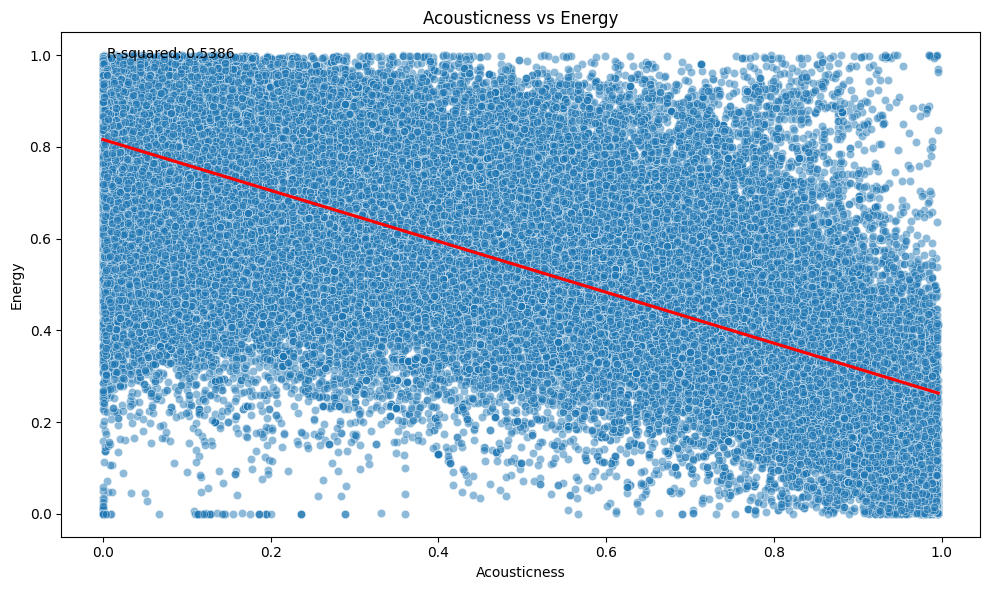

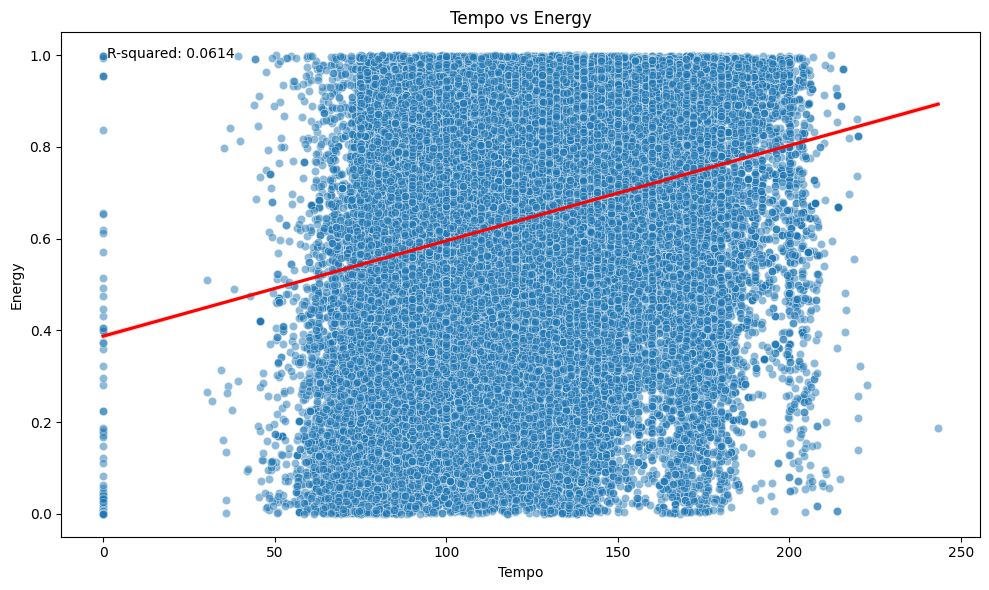

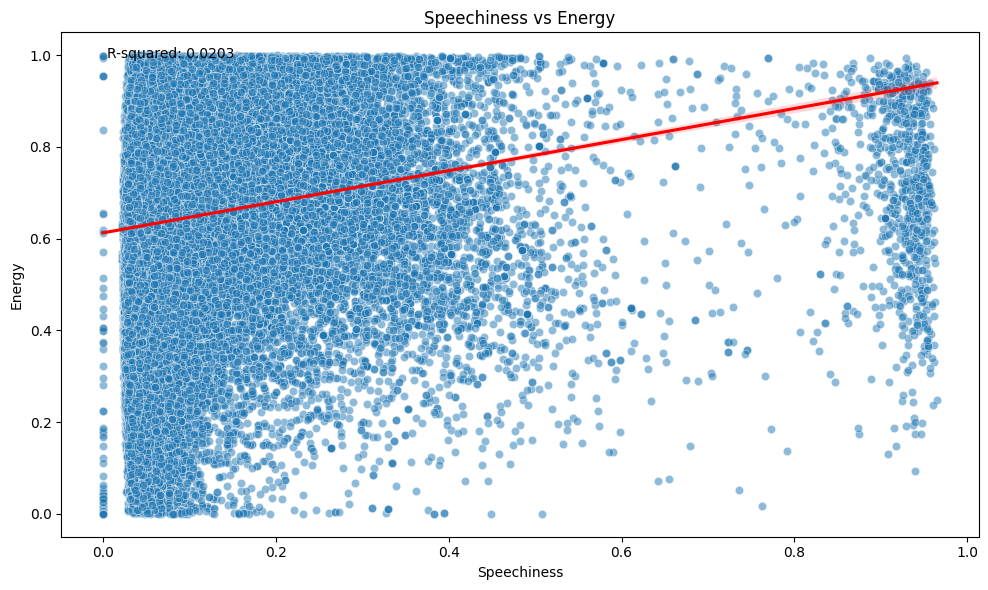

Correlation Analysis Results:
Danceability vs Popularity: R-squared = 0.0013
Liveness vs Popularity: R-squared = 0.0000
Valence vs Popularity: R-squared = 0.0016
Tempo vs Popularity: R-squared = 0.0002
Loudness vs Energy: R-squared = 0.5802
Liveness vs Energy: R-squared = 0.0341
Valence vs Energy: R-squared = 0.0670
Instrumentalness vs Energy: R-squared = 0.0331
Acousticness vs Energy: R-squared = 0.5386
Tempo vs Energy: R-squared = 0.0614
Speechiness vs Energy: R-squared = 0.0203


In [ ]:
"""
Objective 2: Determine if there are correlations between song metrics across all songs. For example, if a song is popular,
does it have a lot of danceability? If a song is loud, does it have a lot of energy? We can use linear regression analysis to compare 2
metrics to each other and determine if they have a positive or negative correlation- if there is any correlation at all. We can also
quantify this correlation by calculating the R-squared value to determine if the correlation is signficant. This objective will utilize
Pandas to perform the described calculations, Matplotlib/Seaborn to visualize resulting calculations, and Scikit-learn to perform regression analysis.
"""

#import libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

#Defining the column pairs for correlation analysis.
## Here we are specifically looking at the relationships of the variables danceability, liveness, valence and tempo with popularity,
## and the variables loudness, liveness, valence, instrumentalness, acousticness, tempo and speechiness with energy.

column_pairs = [
    ('danceability', 'popularity'),
    ('liveness', 'popularity'),
    ('valence', 'popularity'),
    ('tempo', 'popularity'),
    ('loudness', 'energy'),
    ('liveness', 'energy'),
    ('valence', 'energy'),
    ('instrumentalness', 'energy'),
    ('acousticness', 'energy'),
    ('tempo', 'energy'),
    ('speechiness', 'energy'),
]

#Defining a function to perform regression analysis and plot results
def analyze_correlation(df, x_col, y_col):
    x = df[[x_col]]
    y = df[y_col]

 #Perform linear regression
    model = LinearRegression()
    model.fit(x, y)

# Calculate R-squared value
    r_squared = r2_score(y, model.predict(x))

# Create scatter plot with regression line
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x=x_col, y=y_col, alpha=0.5)
    sns.regplot(data=df, x=x_col, y=y_col, scatter=False, color='red')

    plt.title(f'{x_col.capitalize()} vs {y_col.capitalize()}')
    plt.xlabel(x_col.capitalize())
    plt.ylabel(y_col.capitalize())
    plt.text(0.05, 0.95, f'R-squared: {r_squared:.4f}', transform=plt.gca().transAxes)

    plt.tight_layout()
    plt.show()

    return r_squared

# Perform correlation analysis for each column pair
results = {}
for x_col, y_col in column_pairs:
    r_squared = analyze_correlation(df, x_col, y_col)
    results[(x_col, y_col)] = r_squared

# Print summary of results
print("Correlation Analysis Results:")
for (x_col, y_col), r_squared in results.items():
    print(f"{x_col.capitalize()} vs {y_col.capitalize()}: R-squared = {r_squared:.4f}")




In [ ]:
#Objective 3: Determine if grouping songs according to their characteristics will naturally separate them according to their genre.

# If we take metrics such as a song's popularity, danceability, energy, loudness, speechiness, acousticness, instrumentalness,
# tempo, and key into account and utilize clustering to group the songs, can we resolve the separate genres?
# This objective will utilize Scikit-learn to perform PCA and K-means clustering.


In [ ]:
# Importing necessary packages
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_score
import scipy

In [ ]:
df.isna().sum()

,0
Unnamed: 0,0
track_id,0
artists,1
album_name,1
track_name,1
popularity,0
duration_ms,0
explicit,0
danceability,0
energy,0


Number of features after preprocessing: 30


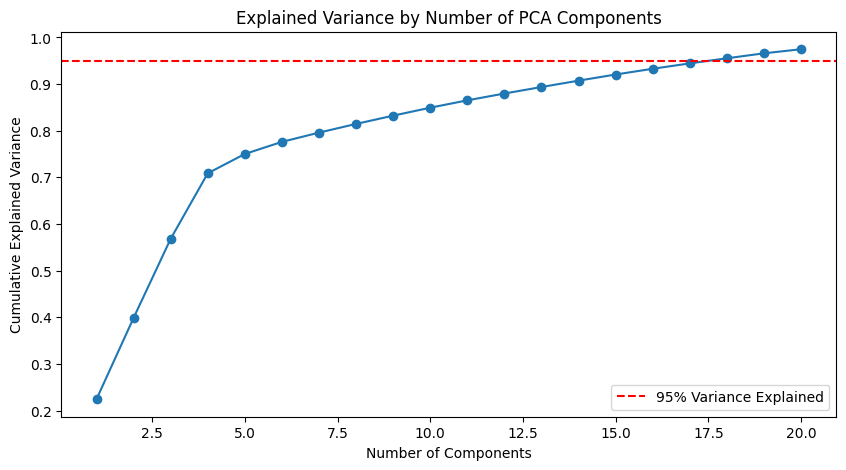

Choosing 4 components
Explained variation per principal component: [0.22446951 0.17429047 0.16950561 0.14047899]
Cumulative variance explained by 4 principal components: 70.87%
Most important features per PC 1:
 num__loudness    0.734204
num__tempo       0.597597
Name: PC-1, dtype: float64


 Most important features per PC 2:
 num__popularity     0.523336
num__duration_ms    0.831791
Name: PC-2, dtype: float64


 Most important features per PC 3:
 num__popularity     0.824747
num__duration_ms    0.536492
Name: PC-3, dtype: float64


 Most important features per PC 4:
 num__loudness    0.578343
num__tempo       0.771910
Name: PC-4, dtype: float64
Optimal number of clusters: 3


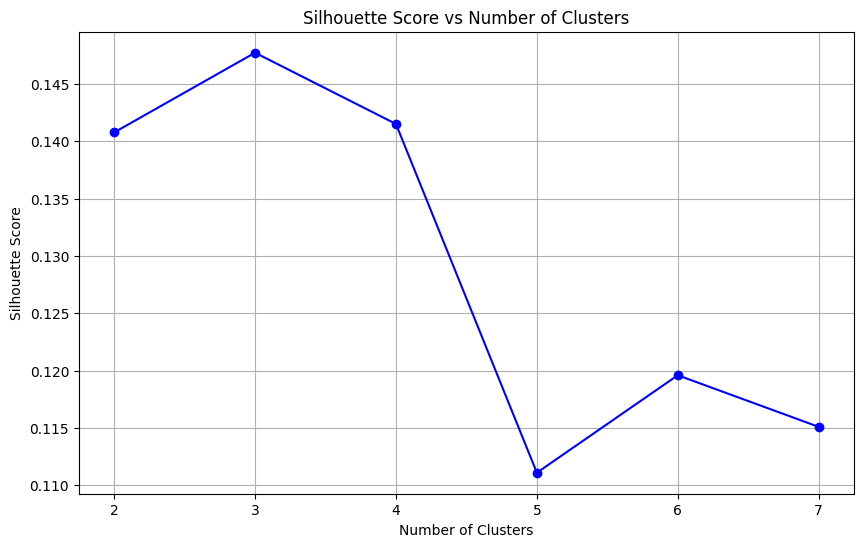

In [ ]:
#  We do not include identifiers and the feature we want to see if we can get clusters for (genre)
# 'Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name', 'track_genre'

# Prepare features for preprocessing
numerical_features = ['popularity', 'duration_ms', 'loudness', 'tempo']
categorical_features = ['key', 'time_signature']
scaled_features = ['danceability', 'energy', 'speechiness', 'acousticness',
                  'instrumentalness', 'liveness', 'valence']
binary_features = ['explicit', 'mode']

# Create preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(sparse_output=False ), categorical_features)
    ],
    remainder='passthrough'
)

# Select features for clustering
X = df[numerical_features + categorical_features + scaled_features + binary_features]

# Fit and transform the data
X_preprocessed = preprocessor.fit_transform(X)
feature_names = preprocessor.get_feature_names_out()
print(f"Number of features after preprocessing: {len(feature_names)}")

# Dimensionality reduction with PCA, determining the ideal # of components
pca = PCA(n_components=20)
X_pca = pca.fit_transform(X_preprocessed)
explained_variance = np.cumsum(pca.explained_variance_ratio_)
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Variance Explained')
plt.title('Explained Variance by Number of PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.legend()
plt.show()

# Perform PCA and calculate explained variance ratio by said PCA components
print("Choosing 4 components")
pca2 = PCA(n_components=4)
X_pca2 = pca2.fit_transform(X_preprocessed)
print('Explained variation per principal component: {}'.format(pca2.explained_variance_ratio_))
print('Cumulative variance explained by 4 principal components: {:.2%}'.format(np.sum(pca2.explained_variance_ratio_)))

# Using pca.components_ to find most importatn features per PC
X_preprocessed = pd.DataFrame(X_preprocessed, columns=feature_names)
pca_components = pd.DataFrame(abs(pca2.components_), columns = X_preprocessed.columns, index = ['PC-1', 'PC-2', 'PC-3', 'PC-4'])
print('Most important features per PC 1:\n', (pca_components[pca_components > 0.3].iloc[0]).dropna())
print('\n\n Most important features per PC 2:\n', (pca_components[pca_components > 0.3].iloc[1]).dropna())
print('\n\n Most important features per PC 3:\n', (pca_components[pca_components > 0.3].iloc[2]).dropna())
print('\n\n Most important features per PC 4:\n', (pca_components[pca_components > 0.3].iloc[3]).dropna())

# Find optimal number of clusters using silhouette score
silhouette_scores = []
K = range(2, 8)  # Test up to 8 clusters

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_pca)
    score = silhouette_score(X_pca, labels)
    silhouette_scores.append(score)

optimal_k = K[np.argmax(silhouette_scores)]
print(f"Optimal number of clusters: {optimal_k}")

# Plotting the silhouette scores versus number of clusters
plt.figure(figsize=(10, 6))
plt.plot(K, silhouette_scores, 'bo-')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.grid()
plt.show()



Detailed Cluster Analysis:

Cluster 0:
Total tracks: 44458
Top genres:
- grindcore: 927 tracks (2.09%)
- happy: 903 tracks (2.03%)
- party: 894 tracks (2.01%)

Cluster 1:
Total tracks: 53087
Top genres:
- forro: 995 tracks (1.87%)
- sertanejo: 988 tracks (1.86%)
- gospel: 952 tracks (1.79%)

Cluster 2:
Total tracks: 16455
Top genres:
- sleep: 952 tracks (5.79%)
- classical: 851 tracks (5.17%)
- new-age: 842 tracks (5.12%)


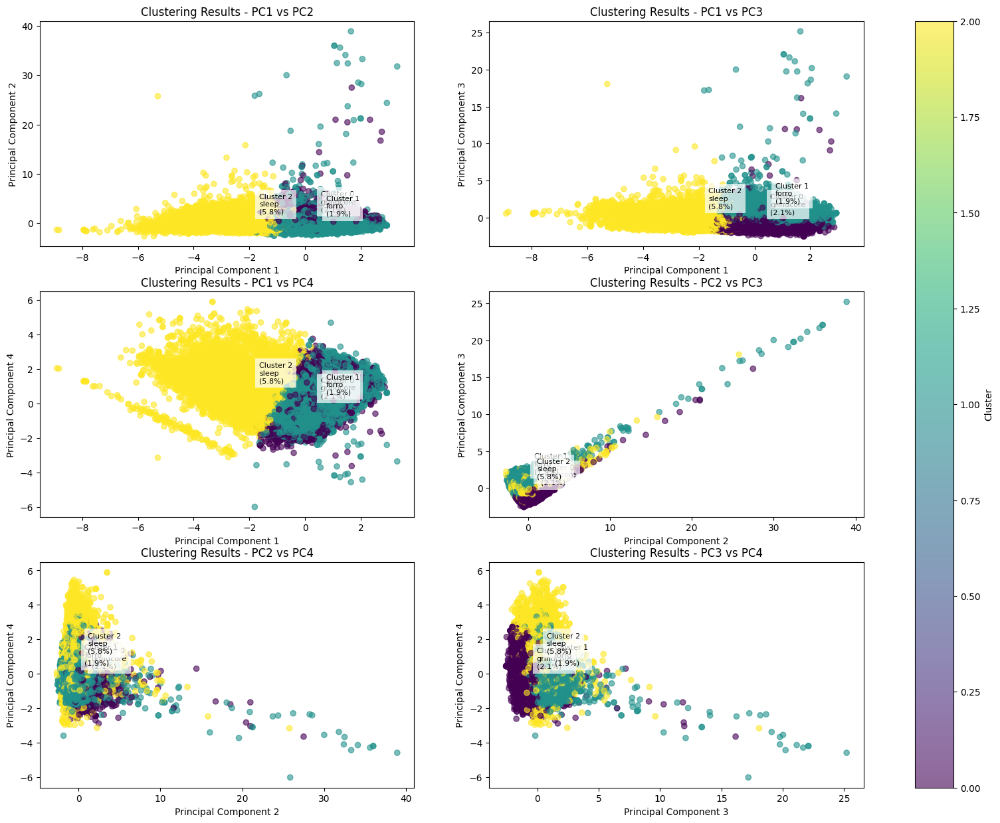

<Figure size 1500x800 with 0 Axes>

In [ ]:
# Perform final clustering with optimal k
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
cluster_labels = kmeans.fit_predict(X_pca2)

# First create the cluster genre dataframe, assigning each song to its cluster + its genre
cluster_genre_df = pd.DataFrame({
    'cluster': cluster_labels,
    'genre': df['track_genre']
})

# Get the most common genres for each cluster
cluster_genre_analysis = {}
for cluster in range(optimal_k): # Go through each cluster one by one
    cluster_genres = cluster_genre_df[cluster_genre_df['cluster'] == cluster]['genre']
    genre_counts = cluster_genres.value_counts() # Count the number of songs in each genre
    top_genres = genre_counts.head(3) # Get the top 3 genres
    total_in_cluster = len(cluster_genres)
    genre_percentages = (top_genres / total_in_cluster * 100).round(2) # Calculate percentage that each genre makes up

    cluster_genre_analysis[f'Cluster {cluster}'] = { # Store the results in a dictionary
        'total_tracks': total_in_cluster,
        'top_genres': [(genre, count, percentage)
                      for (genre, count), percentage in zip(top_genres.items(), genre_percentages)]
    }

# Create visualization with 6 subplots
fig = plt.figure(figsize=(20, 15))
component_pairs = [(0,1), (0,2), (0,3), (1,2), (1,3), (2,3)]
# For each pair of components, create a subplot, scatter plot the data points (songs), color them by cluster
for idx, (comp1, comp2) in enumerate(component_pairs, 1):
    plt.subplot(3, 2, idx)
    scatter = plt.scatter(X_pca2[:, comp1], X_pca2[:, comp2],
                         c=cluster_labels, cmap='viridis',
                         alpha=0.6)
    plt.xlabel(f'Principal Component {comp1+1}')
    plt.ylabel(f'Principal Component {comp2+1}')
    plt.title(f'Clustering Results - PC{comp1+1} vs PC{comp2+1}')

    # Add cluster genre labels for each subplot
    unique_clusters = np.unique(cluster_labels)
    for cluster in unique_clusters:
        cluster_mask = cluster_labels == cluster
        cluster_points = X_pca2[cluster_mask]

        # Get the most common genre for this cluster from our analysis
        top_genre = cluster_genre_analysis[f'Cluster {cluster}']['top_genres'][0][0]
        top_percentage = cluster_genre_analysis[f'Cluster {cluster}']['top_genres'][0][2]

        # Calculate cluster centroid for these components
        centroid = np.mean(cluster_points[:, [comp1, comp2]], axis=0)

        # Add annotation with top genre and percentage of the cluster that genre makes up
        plt.annotate(f'Cluster {cluster}\n{top_genre}\n({top_percentage:.1f}%)',
                    (centroid[0], centroid[1]),
                    xytext=(10, 10), textcoords='offset points',
                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'),
                    fontsize=8, ha='left')

# Add a colorbar
plt.colorbar(scatter, label='Cluster', ax=plt.gcf().get_axes())

# Create new figure for genre distribution
plt.figure(figsize=(15, 8))

# Get the top N genres overall to include in the visualization
N = 10  # Number of top genres to show
top_genres_overall = df['track_genre'].value_counts().head(N).index # Get the top N genres overall

# Create a DataFrame for plotting
plot_data = []
for cluster in range(optimal_k): # Go through each cluster
    cluster_genres = cluster_genre_df[cluster_genre_df['cluster'] == cluster]['genre'] # Get genres for this cluster
    genre_counts = cluster_genres.value_counts() # Count the number of songs in each genre

    # Calculate percentages for selected genres
    for genre in top_genres_overall:
        count = genre_counts.get(genre, 0)
        percentage = (count / len(cluster_genres) * 100)
        plot_data.append({
            'Cluster': f'Cluster {cluster}',
            'Genre': genre,
            'Percentage': percentage
        })

plot_df = pd.DataFrame(plot_data)

# Print detailed cluster analysis
print("\nDetailed Cluster Analysis:")
print("=" * 50) # Print a line to separate the output
for cluster, analysis in cluster_genre_analysis.items():
    print(f"\n{cluster}:")
    print(f"Total tracks: {analysis['total_tracks']}") # Print total number of songs in cluster
    print("Top genres:")
    for genre, count, percentage in analysis['top_genres']: # Print top genres and their percentages
        print(f"- {genre}: {count} tracks ({percentage}%)")

plt.show()


In [ ]:
#Objective 4: Determine if we can predict the genre of a song based on the song's metrics using machine learning.

#Dataset has 116 unique genres, but I want to train on fewer genres that are more distinct from each other.
#Choosing to focus on the following 5 genres: acoustic, country, hip-hop, metal, tango
#I tried using the Logistic Regression model (80% training, 20% testing) and got a .38 accuracy rate, so I tried switching to other models to improve accuracy.
#After doing some research about other machine learning possibilities, I decided to try the RandomForestClassifier from scikit-learn
#RandomForestClassifier gets us .86 accuracy!

#Importing all necessary pacakges- pandas to read dataset into Dataframe and manipulate it, scikit-learn to carry out machine learning
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler

#Loading the dataset in from Google Drive
from google.colab import drive
drive.mount('/content/drive')
file_path = '/content/drive/My Drive/Spotify_Dataset.csv'
df = pd.read_csv(file_path)

#Defining the list of genres I want to train the model on
desired_genres = ['acoustic', 'country', 'hip-hop', 'metal', 'tango']

#Filtering the DataFrame to keep only the rows that have the desired genres
filtered_df = df[df['track_genre'].isin(desired_genres)]

#Exporting the filtered csv so I can see entries and confirm filtering is correct
output_path = '/content/drive/My Drive/Spotify_Dataset_filteredgenres.csv'
filtered_df.to_csv(output_path, index=False)

#Dropping rows with missing values in relevant columns
filtered_df = filtered_df.dropna(subset=['popularity', 'danceability', 'energy', 'key', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'tempo', 'track_genre'])

#Converting the genre column from strings to integers to be able to use the machine learning algorithm (it doesn't take strings)
#0=acoustic, 1=country, 2=hip-hop, 3=metal, 4=tango
filtered_df['track_genre'] = pd.Categorical(filtered_df['track_genre']).codes
#print(filtered_df.head())
#Exporting the filtered csv so I can see entries and confirm integer conversion of genre is correct
output_path = '/content/drive/My Drive/Spotify_Dataset_filteredgenres_integers.csv'
filtered_df.to_csv(output_path, index=False)

#Removing 5 specific songs from the dataset that I would like to use to make predictions later, this way these songs won't be used for training
track_ids_to_remove = ['1EzrEOXmMH3G43AXT1y7pA', '2SpEHTbUuebeLkgs9QB7Ue', '7KXjTSCq5nL1LoYtL7XAwS', '2MuWTIM3b0YEAskbeeFE1i', '3VTQ6Fl09GsFonGJiukMTE']
filtered_df = filtered_df[~filtered_df['track_id'].isin(track_ids_to_remove)]
#print(filtered_df) #should now have 4995 songs instead of 5000, this is indeed the case

#Selecting the song features I want to train (x) on and selecting my desired prediction output (y = genre)
X = filtered_df[['popularity', 'danceability', 'energy', 'key', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'tempo']]
y = filtered_df['track_genre']

#Scaling the features to ensure all features are along the same scale
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#Splitting the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

#Initializing the Random Forest model
model_rf = RandomForestClassifier(n_estimators=100, random_state=42)

#Training the model
model_rf.fit(X_train, y_train)

#Making predictions on the test data
y_pred_rf = model_rf.predict(X_test)

#Evaluating the accuracy of the model
accuracy = accuracy_score(y_test, y_pred_rf)
print(f"Random Forest Accuracy: {accuracy:.2f}")
print(' ') #adding blank line for readability


#Now let's input 1 song from each genre and see if the model can accurately predict its genre
#Mapping the integer code for each genre back to its string for printing
genre_mapping = {0: 'acoustic', 1: 'country', 2: 'hip-hop', 3: 'metal', 4: 'tango'}

#Acoustics song: I'm Yours by Jason Mraz
#Listing metrics for this song
new_song_metrics = [[80, 0.703, 0.444, 11, -9.331, 0.0417, 0.559, 0, 150.96]]
#Scaling the song's metrics to ensure all features are along the same scale as fit to the training data earlier
new_song_scaled = scaler.transform(new_song_metrics)
#Predicting the genre of the song based on metrics
predicted_genre_code = model_rf.predict(new_song_scaled)[0]
#Converting the genre's integer code to its string
predicted_genre = genre_mapping[predicted_genre_code]
#Printing the prediction
print(f"Predicted Genre of Acoustic Song 'I'm Yours': {predicted_genre}")
print(' ')

#Country song: Jolene by Dolly Parton
new_song_metrics = [[73, 0.674, 0.537, 1, -10.971, 0.0363, 0.566, 0, 110.578]]
new_song_scaled = scaler.transform(new_song_metrics)
predicted_genre_code = model_rf.predict(new_song_scaled)[0]
predicted_genre = genre_mapping[predicted_genre_code]
print(f"Predicted Genre of Country Song 'Jolene': {predicted_genre}")
print(' ')

#Hip hop song: HUMBLE. by Kendrick Lamar
new_song_metrics = [[84, 0.908, 0.621, 1, -6.638, 0.102, 0.000282, 0.0000539, 150.011]]
new_song_scaled = scaler.transform(new_song_metrics)
predicted_genre_code = model_rf.predict(new_song_scaled)[0]
predicted_genre = genre_mapping[predicted_genre_code]
print(f"Predicted Genre of Hip Hop Song 'HUMBLE.': {predicted_genre}")
print(' ')

#Metal song: Master of Puppets by Metallica
new_song_metrics = [[81, 0.543, 0.836, 4, -9.11, 0.0353, 0.000647, 0.431, 105.173]]
new_song_scaled = scaler.transform(new_song_metrics)
predicted_genre_code = model_rf.predict(new_song_scaled)[0]
predicted_genre = genre_mapping[predicted_genre_code]
print(f"Predicted Genre of Metal Song 'Master of Puppets': {predicted_genre}")
print(' ')

#Tango song: La Cumparsita by Carlos Gardel
new_song_metrics = [[16, 0.687, 0.46, 8, -6.536, 0.0785, 0.985, 0, 137.994]]
new_song_scaled = scaler.transform(new_song_metrics)
predicted_genre_code = model_rf.predict(new_song_scaled)[0]
predicted_genre = genre_mapping[predicted_genre_code]
print(f"Predicted Genre of Tango Song 'La Cumparsita': {predicted_genre}")
print(' ')

Mounted at /content/drive
Random Forest Accuracy: 0.86
 
Predicted Genre of Acoustic Song 'I'm Yours': acoustic
 
Predicted Genre of Country Song 'Jolene': country
 
Predicted Genre of Hip Hop Song 'HUMBLE.': hip-hop
 
Predicted Genre of Metal Song 'Master of Puppets': metal
 
Predicted Genre of Tango Song 'La Cumparsita': tango
 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
